In [2]:
!pip install diffusers==0.31

     |████████████████████████████████| 2.9 MB 6.0 MB/s            
     |████████████████████████████████| 468 kB 75.3 MB/s            
     |████████████████████████████████| 471 kB 100.4 MB/s            
     |████████████████████████████████| 193 kB 99.6 MB/s            
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2021.11.1
    Uninstalling fsspec-2021.11.1:
      Successfully uninstalled fsspec-2021.11.1
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.15.1
    Uninstalling huggingface-hub-0.15.1:
      Successfully uninstalled huggingface-hub-0.15.1


In [3]:
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]


===================================BUG REPORT===================================
Welcome to bitsandbytes. For bug reports, please run

python -m bitsandbytes

 and submit this information together with your error trace to: https://github.com/TimDettmers/bitsandbytes/issues
bin /opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so
/opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so: undefined symbol: cadam32bit_grad_fp32
CUDA_SETUP: WARNING! libcudart.so not found in any environmental path. Searching in backup paths...
CUDA SETUP: Highest compute capability among GPUs detected: 7.5
CUDA SETUP: Detected CUDA version 113
CUDA SETUP: Loading binary /opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so...


/opt/conda/lib/python3.9/site-packages/bitsandbytes/cextension.py:34: UserWarning: The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.
  warn("The installed version of bitsandbytes was compiled without GPU support. "
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('/usr/local/nvidia/lib')}
  warn(msg)
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: /usr/local/nvidia/lib:/usr/local/nvidia/lib64 did not contain ['libcudart.so', 'libcudart.so.11.0', 'libcudart.so.12.0'] as expected! Searching further paths...
  warn(msg)
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('tcp'), Posix

In [4]:
import torch

In [5]:
device = "cuda"

# 파이프라인 불러오기
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/738 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/716 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [6]:
prompt = str(input('prompt: female astronaut in a spacecraft'))  # 프롬프트를 영어로 입력해보세요

prompt: female astronaut in a spacecraftㅛ


  0%|          | 0/25 [00:00<?, ?it/s]

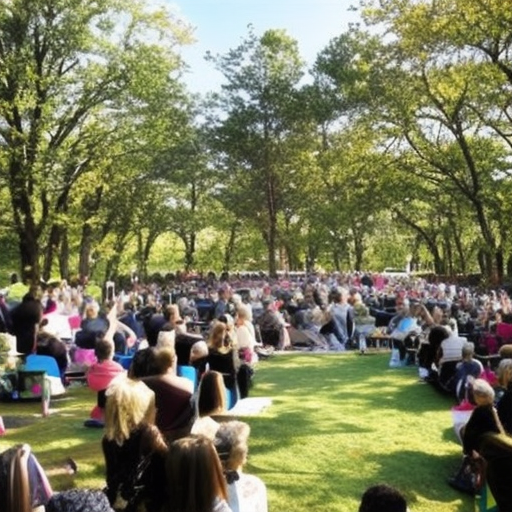

In [25]:
# 이미지 저장 폴더 만들기   
import os
# os.mkdir("/aiffel/aiffel/diffusers")    # diffusers 폴더를 이미 만들었다면 주석 처리해 주세요.

# 입력한 프롬프트를 사용하여 이미지 생성 
image = pipe(prompt, num_inference_steps=25).images[0]

# 이미지 저장
image.save("/aiffel/aiffel/diffusers/image.png")  

# 이미지 출력 
image

In [26]:
# Q. 여러분만의 이미지를 생성해 보세요.
prompt = str(input('prompt: female astronaut in a spacecraft, volumetric lighting,detailed, 8k, reflections. Shot with a Hasselblad medium format camera, soft diffused light from a window reflecting in the visor, background shows a starfield and distant planet'))  # 프롬프트를 영어로 입력해보세요

prompt: female astronaut in a spacecraft, volumetric lighting,detailed, 8k, reflections. Shot with a Hasselblad medium format camera, soft diffused light from a window reflecting in the visor, background shows a starfield and distant planety


In [27]:
# 파이썬 이미지 처리 라이브러리 pillow 불러오기 
from PIL import Image  

# 틀 만들기
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size  
    grid = Image.new('RGB', size=(cols * w, rows * h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box = (i%cols * w, i // cols * h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

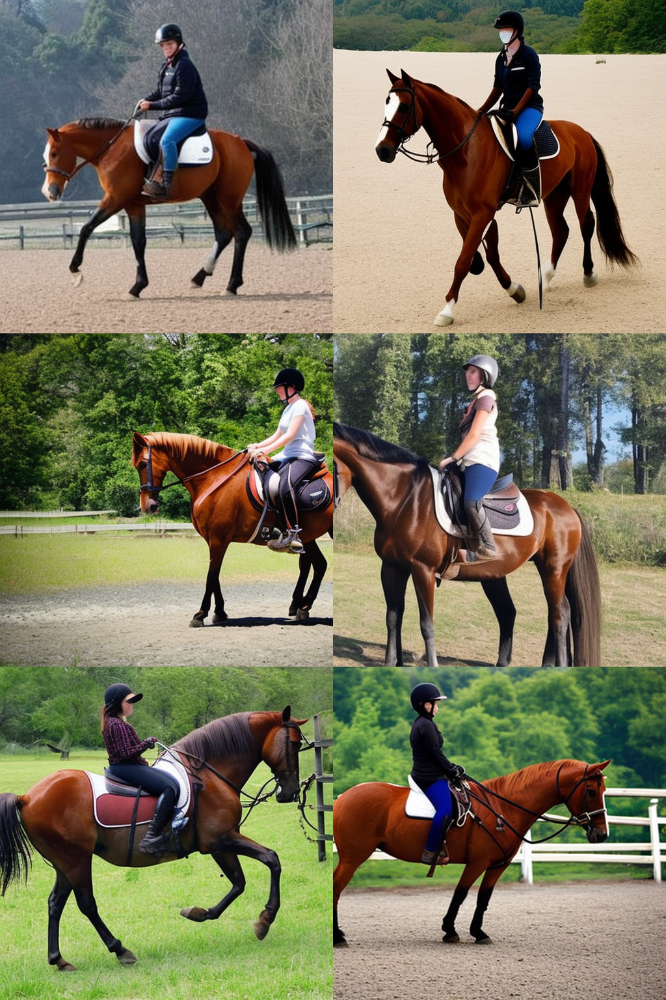

In [28]:
# 이미지의 개수 
num_images = 6

# 프롬프트 입력
prompt = ['a horse riding a person'] * num_images

# 이미지 생성
images = pipe(prompt).images

# 이미지 출력
grid = image_grid(images, rows= 3, cols= 2)
grid

다양한 이미지를 생성하다 보면 RuntimeError: CUDA out of memory.가 나올 때가 있을 거에요. 그럴 때는 아래의 코드를 사용해 보세요.

In [29]:
# GPU 메모리를 지우는 코드입니다. 
torch.cuda.empty_cache()

Image-to-Image Generation
Image-to-Image Generation은 프롬프트뿐 아니라 이미지를 입력으로 넣으면 다른 이미지로 변형시켜 주는 기능입니다. 앞의 영상에서 언급되었던 'AI야 우리 딸 아이 그림 좀 손봐줘'가 이 기능을 사용한 것이죠.

Diffusers에는 이 기능이 포함된 파이프라인을 이미 만들어 두었기 때문에 파이프라인을 불러오기만 하면 쉽게 모델을 사용할 수 있습니다.

In [7]:
# Image-to-Image Generation 파이프라인 불러오기    
from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
model_path = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16,
)
pipe = pipe.to(device)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


하나의 이미지 생성하기
사용할 이미지를 불러옵시다.

이미지를 클라우드에 올려서 사용해도 되고, 아래의 코드와 같이 인터넷에 있는 이미지를 가져와도 좋습니다. 여기서는 허깅페이스에서 제공하는 기본 이미지를 사용해 볼게요.

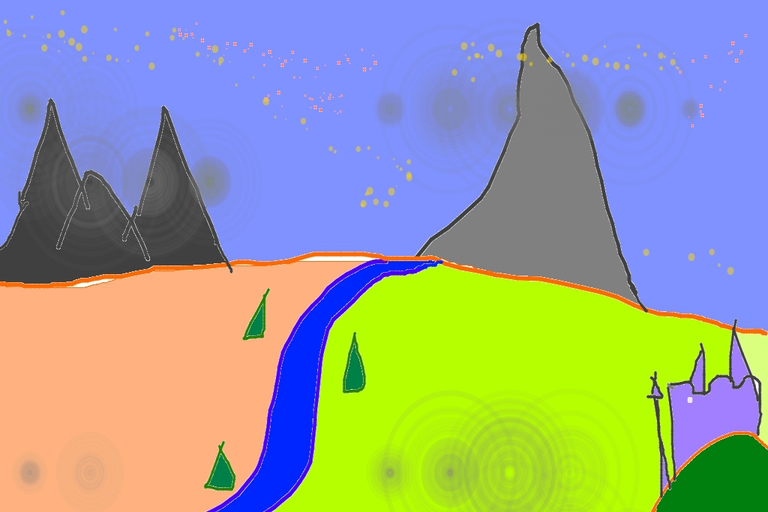

In [31]:
import requests  
from io import BytesIO

url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"

# url 호출하기
response = requests.get(url)

# 이미지 열기
init_img = Image.open(BytesIO(response.content)).convert("RGB")  # 이미지를 메모리로 읽어와서 RGB로 변경합니다. 
init_img = init_img.resize((768, 512))  # 이미지의 크기를 조절합니다. 
init_img

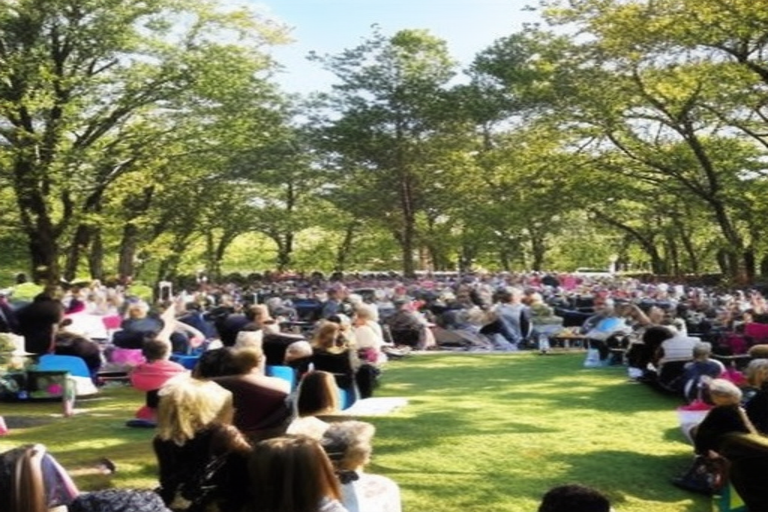

In [32]:
init_img = Image.open("/aiffel/aiffel/diffusers/image.png", mode = 'r')
init_img = init_img.resize((768, 512)) 
init_img

불러온 이미지를 내가 원하는 스타일로 변경할 수 있도록 프롬프트를 작성해 주세요.

In [33]:
prompt = "A fantasy landscape, trending on artstation"

  0%|          | 0/37 [00:00<?, ?it/s]

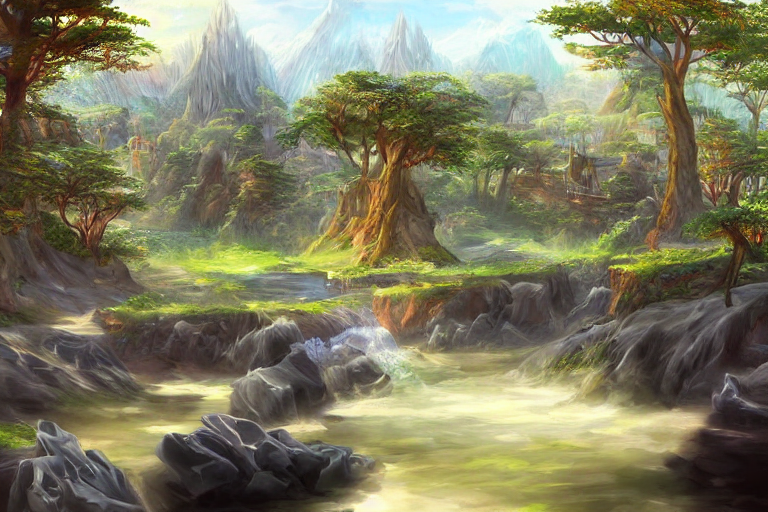

In [34]:
generator = torch.Generator(device=device).manual_seed(1024)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.  

images = pipe(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5).images
images[0].save("/aiffel/aiffel/diffusers/fantasy_landscape.png")
images[0]

이미지를 생성하고 저장해 보겠습니다. 아래의 코드에는 조절할 수 있는 하이퍼파라미터가 있습니다.

seed: 동일한 입력 문장과 각종 설정을 넣었을 때 동일한 시드 값을 주면 같은 이미지를 생성할 수 있습니다.
strength: 레퍼런스 이미지에서 얼마나 변형할지를 설정하는 하이퍼파라미터로, 값이 커질수록 원본 이미지와 다른 이미지를 생성합니다. 0과 1 사이의 값을 선택할 수 있으며, default는 0.8입니다.
guidance_scale: 얼마나 주어진 프롬프트에 근접한 이미지를 생성할지를 설정하는 하이퍼파라미터로, 값이 커질수록 문자열에 근접한 이미지가 생성되지만 이미지 품질이 떨어질 수 있습니다. default는 7.5입니다.
num_inference_steps: denoising 스텝 수로, 값이 커질수록 고해상도 이미지가 출력되지만 출력되는 시간이 오래 걸립니다.

여러 개의 이미지 생성하기
여러 개의 프롬프트를 사용하여 여러 장의 이미지를 한번에 생성할 수도 있습니다. Text-to-Image Generation에서 사용했던 코드를 사용하였으니 코드를 자유롭게 변경해 보세요.

In [35]:
num_images = 6

# 프롬프트 입력
prompt = ['female astronaut in a spacecraft'] * num_images

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1024)
images = pipe(prompt=prompt, image=init_img, strength=0.9, guidance_scale=13.5, num_inference_steps=50, generator=generator).images
images

# 이미지 출력
grid = image_grid(images, rows=2, cols=3)
grid

/opt/conda/lib/python3.9/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:768: FutureWarning: You have passed 6 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/45 [00:00<?, ?it/s]

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:8                                                                                    │
│                                                                                                  │
│    5                                                                                             │
│    6 # 이미지 생성                                                                               │
│    7 generator = torch.Generator(device=device).manual_seed(1024)                                │
│ ❱  8 images = pipe(prompt=prompt, image=init_img, strength=0.9, guidance_scale=13.5, num_infe    │
│    9 images                                                                                      │
│   10                                                                                             │
│   11 # 이미지 출력                                                                               │
│                                                                                                  │
│ /opt/conda/lib/python3.9/site-packages/torch/autograd/grad_mode.py:27 in decorate_context        │
│                                                                                                  │
│    24 │   │   @functools.wraps(func)                                                             │
│    25 │   │   def decorate_context(*args, **kwargs):                                             │
│    26 │   │   │   with self.clone():                                                             │
│ ❱  27 │   │   │   │   return func(*args, **kwargs)                                               │
│    28 │   │   return cast(F, decorate_context)                                                   │
│    29 │                                                                                          │
│    30 │   def _wrap_generator(self, func):                                                       │
│                                                                                                  │
│ /opt/conda/lib/python3.9/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diff │
│ usion_img2img.py:1088 in __call__                                                                │
│                                                                                                  │
│   1085 │   │   │   │   latent_model_input = self.scheduler.scale_model_input(latent_model_input  │
│   1086 │   │   │   │                                                                             │
│   1087 │   │   │   │   # predict the noise residual                                              │
│ ❱ 1088 │   │   │   │   noise_pred = self.unet(                                                   │
│   1089 │   │   │   │   │   latent_model_input,                                                   │
│   1090 │   │   │   │   │   t,                                                                    │
│   1091 │   │   │   │   │   encoder_hidden_states=prompt_embeds,                                  │
│                                                                                                  │
│ /opt/conda/lib/python3.9/site-packages/torch/nn/modules/module.py:1130 in _call_impl             │
│                                                                                                  │
│   1127 │   │   # this function, and just call forward.                                           │
│   1128 │   │   if not (self._backward_hooks or self._forward_hooks or self._forward_pre_hooks o  │
│   1129 │   │   │   │   or _global_forward_hooks or _global_forward_pre_hooks):                   │
│ ❱ 1130 │   │   │   return forward_call(*input, **kwargs)                                         │
│   1131 │   │   # Do not call functions when jit is used                                          │
│   1132 │   │   full_backward_hooks, non_full_backward_hooks = [], [] 

12-1. 프로젝트: ControlNet으로 조건을 준 이미지 생성하기
지금까지는 Stable Diffusion 모델만을 이용하여 이미지를 생성하거나 이미지의 스타일을 바꾸는 실습을 해보았습니다. 이번에는 여기서 조금 더 나아가서 ControlNet을 사용하여 이미지에 조건을 주어 이미지를 다양하게 변형해보려고 합니다. 어떤 결과가 나올지 기대되지 않으시나요?

ControlNet이란?
Stable Diffusion은 텍스트 프롬프트 또는 입력 이미지를 통하여 이미지를 생성하지만 생성된 이미지를 원하는 대로 출력하기 어렵습니다. 아무리 프롬프트를 자세하게 써도 생성되는 이미지가 내가 원하는 자세, 구도, 배경을 갖도록 하는 것은 거의 불가능하죠. ControlNet은 Diffusion 모델에 추가 조건을 추가하여 출력되는 이미지를 쉽게 제어할 수 있습니다. 뿐만 아니라 ControlNet은 훈련 데이터가 작아도 학습이 잘 되고 빠르다는 장점이 있어 개인용 기기에서 사용할 수 있다는 장점이 있습니다.

ControlNet은 논문 'Adding Conditional Control to Text-to-Image Diffusion Models'에서 소개되었고, 외곽선 감지(Canny Edge detection), 인체 자세 감지(Human pose), 낙서 지도(Scribble map), 시맨틱 세그멘테이션(Semantic segmentation) 등 다양한 전처리기(Preprocessor)를 Stable Diffusion 모델에 도입할 수 있습니다. 그래서 원하는 자세, 구도 등으로 이미지를 생성할 수 있습니다.

이번 프로젝트는 허깅페이스에서 제공하는 실습 코드를 수정 및 재구성하였습니다.

In [8]:
!pip install transformers==4.28
!pip install accelerate==0.20.3
!pip install diffusers==0.31
!pip install triton==2.1

     |████████████████████████████████| 89.3 MB 86.6 MB/s            


이미지를 생성하다 보면 CUDA out of memery가 나올 때가 있습니다. 그럴 때는 아래 코드의 주석을 풀고 사용해 보세요.

In [ ]:
# 메모리 삭제
# torch.cuda.empty_cache()

윤곽선 검출
윤곽선을 검출해 봅시다. ControlNet은 다양한 윤곽선 검출 알고리즘을 제공하지만 우리는 가장 유명하고 효과적인 윤곽선 검출 알고리즘인 Canny 알고리즘을 사용할 거에요.

먼저 이미지를 불러옵니다. 누구나 익히 아는 이미지를 사용하였습니다.

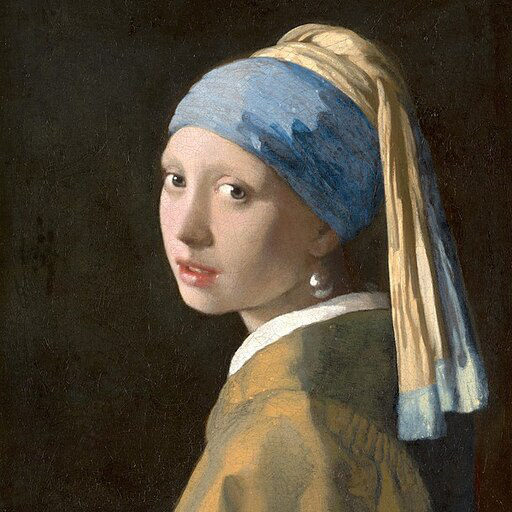

In [9]:
import torch
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image 

# 이미지 불러오기
image = load_image(
    "https://hf.co/datasets/huggingface/documentation-images/resolve/main/diffusers/input_image_vermeer.png"
)

image

OpenCV를 사용하여 이미지의 윤곽선을 검출합니다.

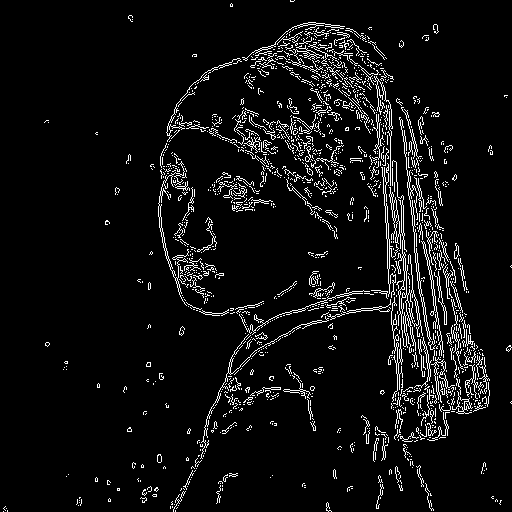

In [43]:
import cv2
from PIL import Image 
import numpy as np

# 이미지를 NumPy 배열로 변환합니다. 
image = np.array(image)

# threshold를 지정합니다. 
low_threshold = 100
high_threshold = 200

# 윤곽선을 검출합니다. 
image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)  # NumPy 배열을 PIL 이미지로 변환합니다. 

canny_image

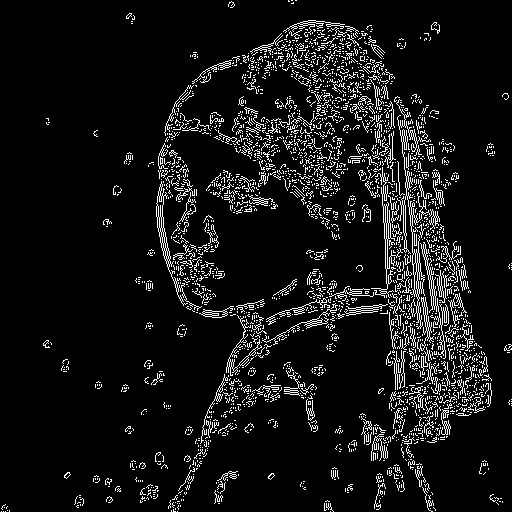

In [45]:
import cv2
from PIL import Image 
import numpy as np

# 이미지를 NumPy 배열로 변환합니다. 
image = np.array(image)

# threshold를 지정합니다. 
low_threshold = 500
high_threshold = 1000

# 윤곽선을 검출합니다. 
image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)  # NumPy 배열을 PIL 이미지로 변환합니다. 

canny_image

윤곽선 검출 전처리기를 사용한 모델 파이프라인을 불러오겠습니다.

In [10]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

canny_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
canny_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=canny_controlnet, torch_dtype=torch.float16
)

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [52]:
# 메모리 삭제
torch.cuda.empty_cache()

윤곽선을 추출한 이미지에 프롬프트를 적용하여 새로운 이미지를 생성해 보겠습니다.

  0%|          | 0/20 [00:00<?, ?it/s]

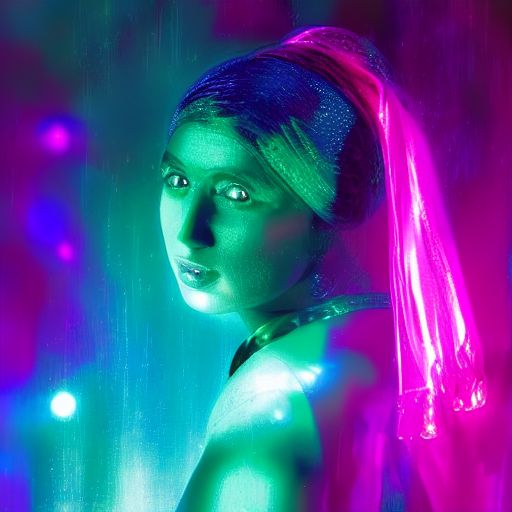

In [11]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다. 
generator = torch.manual_seed(0)  

# 이미지를 생성합니다. 
canny_image = canny_pipe(
    prompt="disco dancer with colorful lights", 
    num_inference_steps=20, 
    generator=generator, 
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다. 
canny_image.save("/aiffel/aiffel/canny_image.png")  

# 생성된 이미지를 출력합니다. 
canny_image

프롬프트 외에도 부정적인 프롬프트(negative_propmt)를 넣을 수도 있고, 하이퍼파라미터를 조절할 수도 있습니다.

negative_propmt: 원하지 않는 요소를 적을 수 있습니다.
controlnet_conditioning_scale: ContorlNet으로 조건을 어느 정도 주느냐를 조절합니다. Default는 1이고, 실수값으로 설정할 수 있습니다.
num_inference_steps: 추론 횟수로, 값이 커질수록 고해상도 이미지가 출력되지만 출력되는 시간이 오래 걸립니다. default 값은 50입니다.
guidance_scale: 얼마나 주어진 프롬프트에 근접한 이미지를 생성할지를 설정하는 하이퍼파라미터로, 값이 커질수록 문자열에 근접한 이미지가 생성되지만 이미지 품질이 떨어질 수 있습니다. default는 7.5입니다.
프롬프트와 부정적인 프롬프트는 ChatGPT를 이용하여 생성해 보세요. 직접 프롬프트를 작성하는 것보다 더 멋진 이미지를 생성할 수 있어요.

  0%|          | 0/20 [00:00<?, ?it/s]

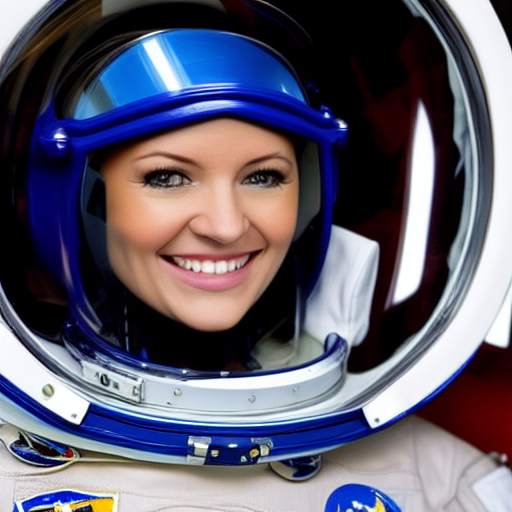

In [20]:
# Q. 프롬프트를 작성하고 하이퍼파라미터를 조절하여 이미지를 생성해 보세요. 
# 동일한 이미지를 생성하기 위해 seed를 지정합니다. 
generator = torch.manual_seed(0)  

# 이미지를 생성합니다. 
canny_image = canny_pipe(
    prompt="female astronaut in a spacecraft", 
    num_inference_steps=20, 
    generator=generator, 
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다. 
canny_image.save("/aiffel/aiffel/canny_image.png")  

# 생성된 이미지를 출력합니다. 
canny_image

인체 자세 감지
Openpose는 인체 자세 감지(Human pose)를 할 수 있는 전처리기입니다. 자세를 감지하여 새로운 이미지를 생성해 줍니다.

먼저 사람의 전신이 담긴 이미지를 불러오겠습니다.

In [11]:
# controlnet-aux를 설치합니다. Human pose를 검출해주는 controlnet의 보조용 모델입니다.
!pip install controlnet-aux==0.0.1

     |████████████████████████████████| 64 kB 2.9 MB/s             


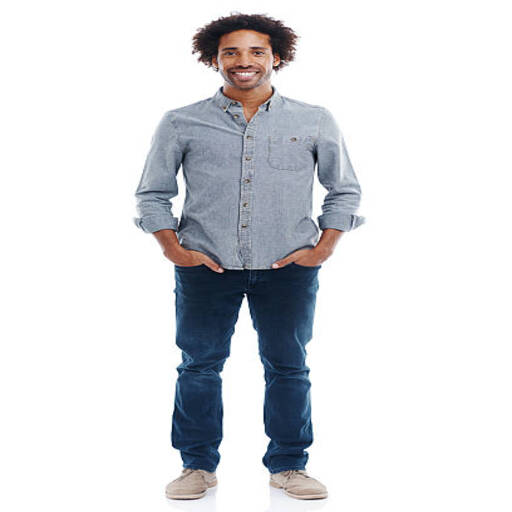

In [12]:
from diffusers.utils import load_image

openpose_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/person.png"
)
openpose_image

Openpose 검출기를 사용하면 자세만 추출할 수 있습니다.

body_pose_model.pth:   0%|          | 0.00/209M [00:00<?, ?B/s]

cuda


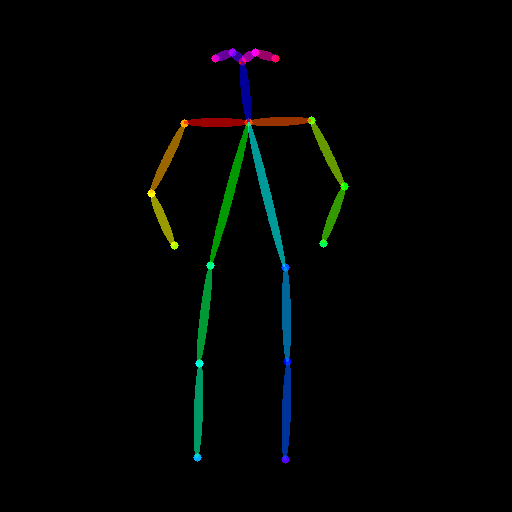

In [13]:
from controlnet_aux import OpenposeDetector

# 인체의 자세를 검출하는 사전 학습된 ControlNet 불러오기
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# 이미지에서 자세 검출
openpose_image = openpose(openpose_image)
openpose_image

Openpose 전처리기를 사용한 모델 파이프라인을 불러옵니다.

In [14]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel 

openpose_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16)
openpose_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=openpose_controlnet, torch_dtype=torch.float16
)

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


새로운 이미지를 생성해 보겠습니다. Canny Edge Detection에서 사용한 코드를 참고하여 여러분들이 직접 코드를 작성해 보세요. 하이퍼파라미터를 조절하면 더 멋진 이미지를 생성할 수 있을 거에요.

  0%|          | 0/20 [00:00<?, ?it/s]

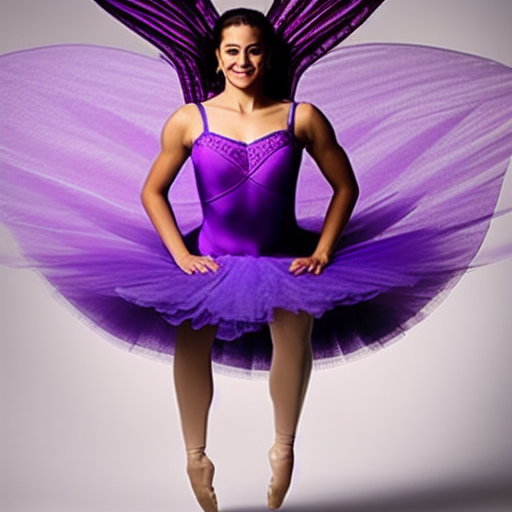

In [17]:
from diffusers import UniPCMultistepScheduler
import torch


openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cuda")

# Q. 코드를 작성해 보세요.
# 동일한 이미지를 생성하기 위해 seed를 넣어줍니다. 
generator = torch.manual_seed(1)  

#프롬프트를 작성합니다. 
prompt =  "a flying ballerina"  # 튜플이 아닌 문자열로 수정
negative_prompt = "ugly, deformed, noisy" # [[YOUR CODE]] - Negative 프롬프트 추가 (선택 사항)

# ControlNet에 입력으로 사용할 이미지를 준비합니다. 이 부분은 openpose_image 변수가 이미 정의되어 있다고 가정합니다.
# 만약 정의되어 있지 않다면, openpose_image에 적절한 이미지를 넣어주세요.
# 예시: openpose_image = Image.open("path/to/your/openpose_image.png")
# openpose_image가 정의되어 있지 않으면 아래 코드는 에러를 발생시킬 수 있습니다.
images = openpose_image

# 이미지를 생성합니다. 
openpose_image1 = openpose_pipe(prompt, image=openpose_image, num_inference_steps=20, generator=generator, negative_prompt=negative_prompt).images[0] # [[YOUR CODE]]

# 생성된 이미지를 출력합니다. 
openpose_image1  # Display the image in a notebook (Jupyter, Colab)
# openpose_image1.save("generated_image.png")  # Save the image to a file (선택 사항)

  0%|          | 0/50 [00:00<?, ?it/s]

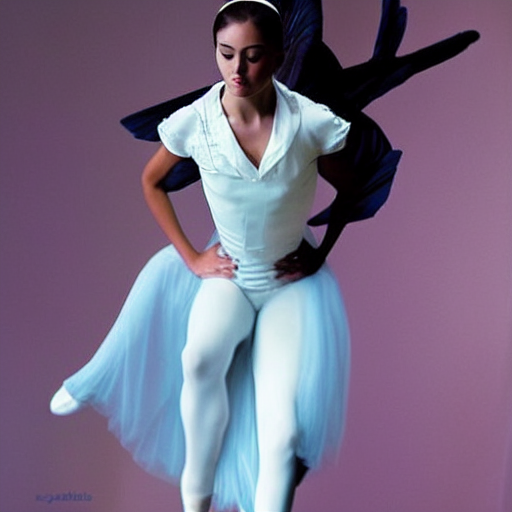

In [18]:
# Q. 프롬프트를 작성하고 하이퍼파라미터를 조절하여 이미지를 생성해 보세요. 
# Q. 코드를 작성해 보세요.
# 동일한 이미지를 생성하기 위해 seed를 넣어줍니다. 
generator = torch.manual_seed(0)  

#프롬프트를 작성합니다. 
prompt =  "a flying ballerina"  # 튜플이 아닌 문자열로 수정
# negative_prompt = "ugly, deformed, noisy" # [[YOUR CODE]] - Negative 프롬프트 추가 (선택 사항)

# ControlNet에 입력으로 사용할 이미지를 준비합니다. 이 부분은 openpose_image 변수가 이미 정의되어 있다고 가정합니다.
# 만약 정의되어 있지 않다면, openpose_image에 적절한 이미지를 넣어주세요.
# 예시: openpose_image = Image.open("path/to/your/openpose_image.png")
# openpose_image가 정의되어 있지 않으면 아래 코드는 에러를 발생시킬 수 있습니다.
images = openpose_image

# 이미지를 생성합니다. 
openpose_image1 = openpose_pipe(prompt, image=openpose_image, num_inference_steps=50, generator=generator, negative_prompt=negative_prompt).images[0] # [[YOUR CODE]]

# 생성된 이미지를 출력합니다. 
openpose_image1  # Display the image in a notebook (Jupyter, Colab)
# openpose_image1.save("generated_image.png")  # Save the image to a file (선택 사항)

윤곽선 검출 + 인체 자세 감지
이번에는 위에서 실습한 2가지의 전처리기를 동시에 사용해 보겠습니다. 2개의 전처리기를 controlnets라는 리스트로 만들어 파이프라인으로 전달하면 됩니다.

Canny 알고리즘을 사용한 윤곽선 검출
먼저 Canny 알고리즘으로 윤곽선을 검출합니다. Canny 알고리즘으로 윤곽선을 검출한 이미지 위에 인체 자세 검출 전처리기를 올려줄 것이기 때문에 인체 자세를 넣어줄 부분을 이미지 내에서 지워주어야 한다는 점을 주의하세요.

직접 아래의 코드를 작성해 보세요.

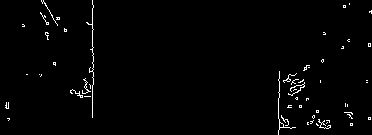

In [3]:
from diffusers.utils import load_image 
from PIL import Image
import cv2
import numpy as np
from diffusers.utils import load_image

# Q. 코드를 작성해 보세요.
# 이미지를 불러오세요. 
canny_image = load_image(
    "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTemBcYGtaOYKqjtfg2bOTZC6KZMlp9dW3XCw&s"
)
#canny_image = # [[YOUR CODE]]

#threshhold를 지정합니다. 
low_threshold = 100
high_threshold = 200

# 이미지를 NumPy 배열로 변환합니다. 
canny_image = np.array(canny_image)

# 인체 감지 포즈를 넣어줄 가운데 부분을 지워줍니다. 
zero_start = canny_image.shape[1] // 4
zero_end = zero_start + canny_image.shape[1] // 2
canny_image[:, zero_start:zero_end] = 0

# 윤곽선을 검출하고 NumPy 배열을 PIL 이미지로 변환합니다. 
canny_image = cv2.Canny(canny_image, low_threshold, high_threshold)
canny_image = Image.fromarray(canny_image)

canny_image

Openpose를 사용한 인체 자세 검출
인체 자세를 검출해 줍니다.

cuda


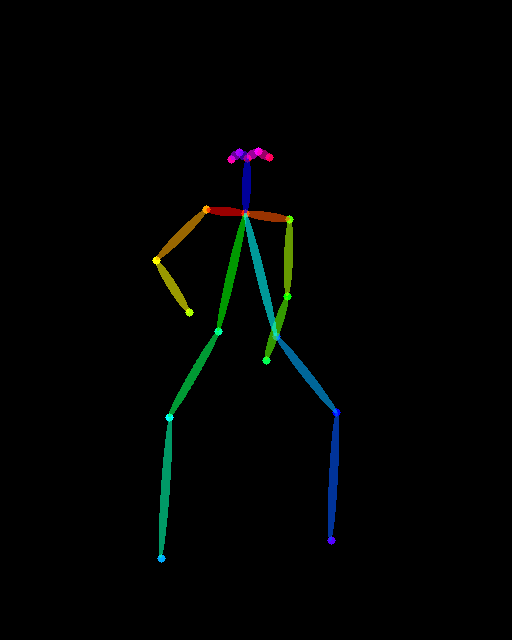

In [4]:
from controlnet_aux import OpenposeDetector
from diffusers.utils import load_image 

# Q. 아래의 코드를 작성해 주세요.
# 이미지를 불러옵니다. 
openpose_image = load_image(
    "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRHzflBBDUKWuNIvCt7_lkU5oaaNHoyv7SkhA&s"
)

# OpenposeDetector를 사용하여 인체 자세를 검출합니다. 
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
openpose_image = openpose(openpose_image)

openpose_image

In [ ]:
Edge Detection과 Openpose, 2개의 전처리기를 controlnets라는 리스트로 만들어 파이프라인으로 전달합니다.

In [19]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler  
import torch

# Q. 코드를 작성해 보세요.

canny_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
openpose_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16)

# Edge Detection과 Openpose, 2개의 전처리기를 controlnets라는 리스트로 만듭니다. 
controlnets = [canny_controlnet, openpose_controlnet]

# 리스트 controlnets를 파이프라인으로 전달합니다. 
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnets,
    torch_dtype=torch.float16,
    low_cpu_mem_usage=True
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")


# 프롬프트를 작성합니다. 
prompt =  ["a futuristic samurai in a battle stance, neon lights, cyberpunk city", " soccer player kicking a ball, cinematic lighting, ultra-realistic"]
negative_prompt = ["blurry"] * 2

# seed를 지정합니다. 
generator = torch.manual_seed(2)

# ✅ ControlNet에 전달할 입력 이미지 (512x512로 크기 조정)
image_size = (512, 512)  # ✅ Stable Diffusion 모델이 기대하는 크기
openpose_image = openpose_image.resize(image_size, Image.LANCZOS)  # 이미지 리사이징
canny_image = canny_image.resize(image_size, Image.LANCZOS)  # 이미지 리사이징

images = [canny_image, openpose_image]##두 이미지의 순서도 중요함. 

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:
# 이미지를 생성합니다. 
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=10, 
    generator=generator, 
    image=images
).images

# 생성된 이미지를 저장합니다.
image[0].save("/aiffel/aiffel/multi_controlnet_output_3.png")
image[1].save("/aiffel/aiffel/multi_controlnet_output_4.png")


# 생성된 이미지를 출력합니다.  
# print(image[0], image[1])

지금까지 ContolNet을 사용하여 이미지를 생성해 보았습니다. 코드 몇 줄이면 멋진 이미지를 생성할 수 있다는 것이 신기하지 않나요?

프로젝트를 통해 생성된 이미지를 개인 블로그, 깃헙, SNS에 올려 주변 사람들에게 공유해 보세요.

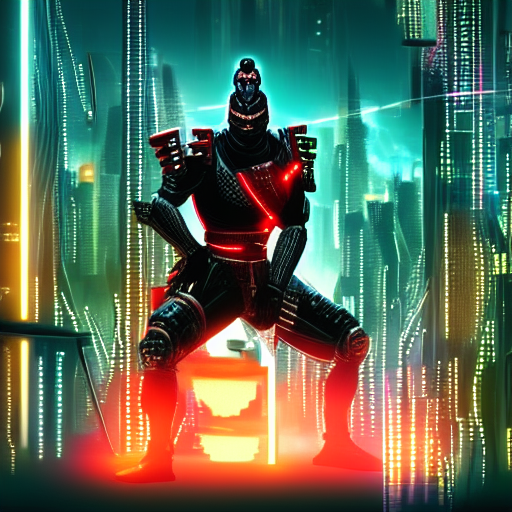

In [20]:
image[0]

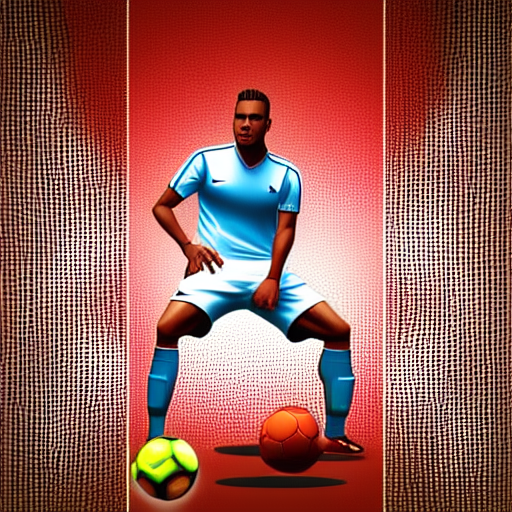

In [21]:
image[1]



Test1. 옵션 추가 - guidance_scale=7.5, controlnet_conditioning_scale = [0.5, 0.5] 추가



In [26]:
# 이미지를 생성합니다. 
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=10, #이미지를 생성할 때 거치는 디퓨전(노이즈 제거) 단계의 수.
    generator=generator, 
    image=images,
    guidance_scale=7.5, #프롬프트를 얼마나 강하게 따를 것인지를 결정.
    controlnet_conditioning_scale = [0.5, 0.5]##OpenPose,Canny Edge Detection의 영향(0~1.0사이로 조절)   
).images

# 생성된 이미지를 저장합니다.
image[0].save("/aiffel/aiffel/multi_controlnet_output_5.png")
image[1].save("/aiffel/aiffel/multi_controlnet_output_6.png")


# 생성된 이미지를 출력합니다.  
# print(image[0], image[1])

  0%|          | 0/10 [00:00<?, ?it/s]

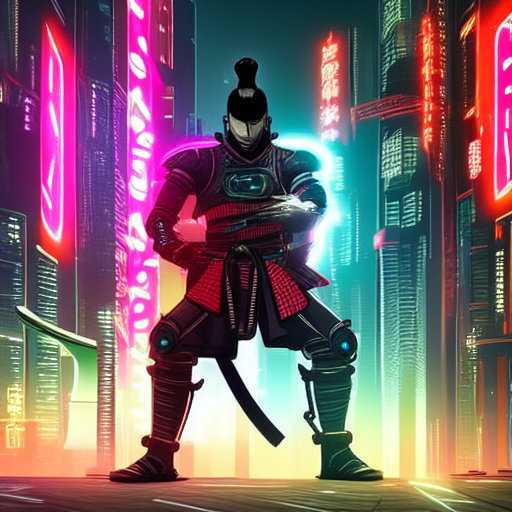

In [27]:
image[0]

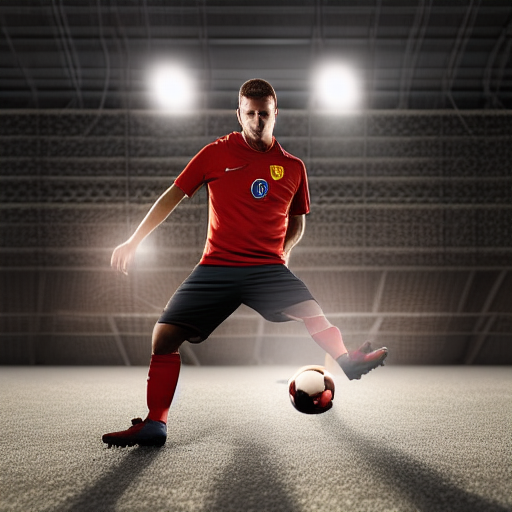

In [28]:
image[1]



Test2. OpenPose의 영향을 약하게(0.1),Canny Edge Detection의 영향을 강하게(0.9)



In [29]:
# 이미지를 생성합니다. 
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=10, 
    generator=generator, 
    image=images,
    guidance_scale=7.5,
    controlnet_conditioning_scale = [0.1, 0.9] #OpenPose의 영향을 약하게(0.1),Canny Edge Detection의 영향을 강하게(0.9).
).images

# 생성된 이미지를 저장합니다.
image[0].save("/aiffel/aiffel/multi_controlnet_output_7.png")
image[1].save("/aiffel/aiffel/multi_controlnet_output_8.png")


# 생성된 이미지를 출력합니다.  
# print(image[0], image[1])

  0%|          | 0/10 [00:00<?, ?it/s]

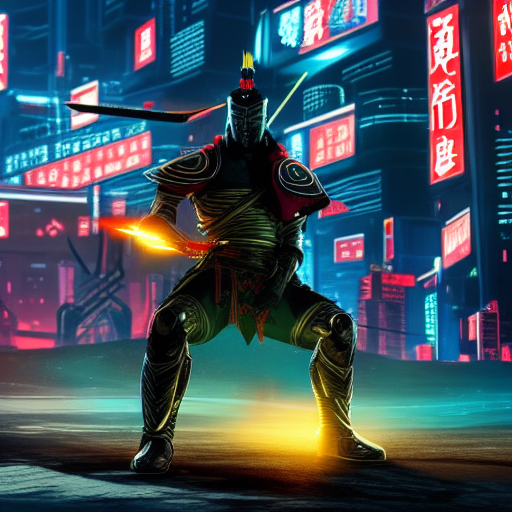

In [30]:
image[0]

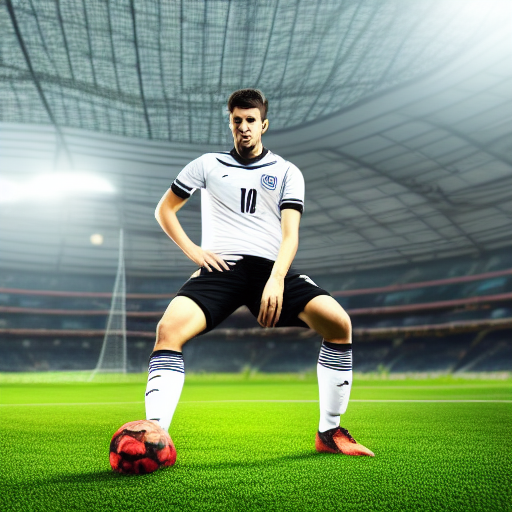

In [31]:
image[1]



Test3. 프롬프트를 얼마나 강하게 따를 것인지를 결정(7.5 => 2.5)



In [32]:
# 이미지를 생성합니다. 
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=10, 
    generator=generator, 
    image=images,
    guidance_scale=2.5,##프롬프트를 얼마나 강하게 따를 것인지를 결정(7.5 => 2.5)
    controlnet_conditioning_scale = [0.1, 0.9] #OpenPose의 영향을 약하게(0.1),Canny Edge Detection의 영향을 강하게(0.9).
).images

# 생성된 이미지를 저장합니다.
image[0].save("/aiffel/aiffel/multi_controlnet_output_9.png")
image[1].save("/aiffel/aiffel/multi_controlnet_output_10.png")


# 생성된 이미지를 출력합니다.  
# print(image[0], image[1])

  0%|          | 0/10 [00:00<?, ?it/s]

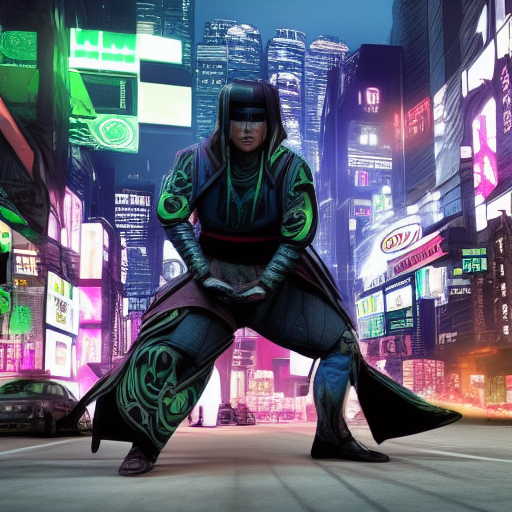

In [33]:
image[0]

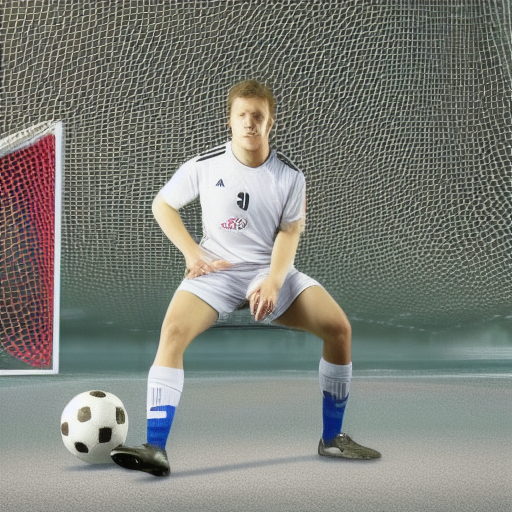

In [34]:
image[1]